In [12]:
import numpy as np
import networkx as nx
from scipy.sparse import csr_array

import matplotlib.pyplot as plt
import seaborn as sns
from cci.utils import get_adata
import warnings
from anndata import ImplicitModificationWarning
from torch_geometric.utils import from_scipy_sparse_matrix

warnings.filterwarnings("ignore", category=ImplicitModificationWarning)
warnings.filterwarnings("ignore", category=UserWarning)

custom_params = {"axes.spines.right": False, "axes.spines.top": False}
sns.set_theme(style="ticks", font_scale=1.0, rc=custom_params)
%config InlineBackend.figure_format="retina"

In [7]:
# We look at the VISp region
adata = get_adata("VISp")

# Cell count distribution per z section
display(adata.obs[['brain_section_label','z_section']].sort_values('z_section').value_counts().to_frame())

,,count
brain_section_label,z_section,
C57BL6J-638850.30,5.0,9242
C57BL6J-638850.29,4.8,8713
C57BL6J-638850.28,4.6,7780
C57BL6J-638850.31,5.4,6939
C57BL6J-638850.32,5.6,6662
C57BL6J-638850.26,4.2,6379
C57BL6J-638850.25,4.0,4449
C57BL6J-638850.27,4.4,3956
C57BL6J-638850.33,5.8,2913


In [52]:
# Create a dataframe from a slice of VISp with the most cells
one_sec = adata[adata.obs["z_section"] == 5.0, :]
subclass_color_dict = one_sec.obs[["subclass_color", "subclass"]].drop_duplicates()
subclass_color_dict = subclass_color_dict.set_index("subclass").to_dict()["subclass_color"]
df = one_sec.obs.copy()

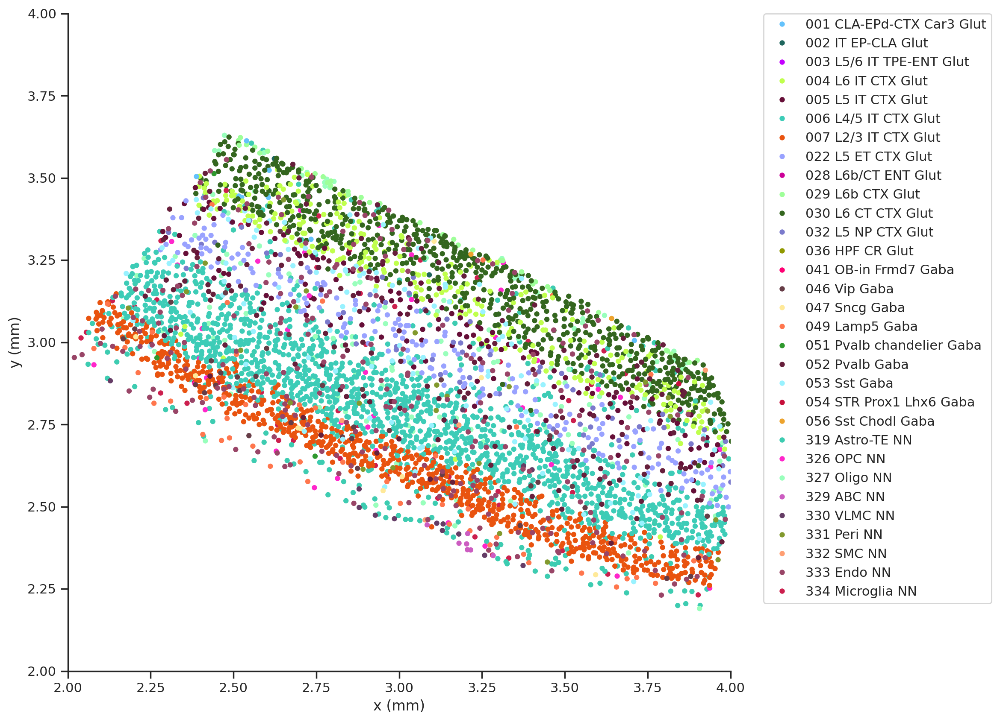

In [31]:
# Plot a section of the slice

# Color palette for subclasses as a dict.
ref = one_sec.obs[['subclass_color', 'subclass']].drop_duplicates()
ref = ref.set_index('subclass').to_dict()['subclass_color']

f, ax = plt.subplots(1, 1, figsize=(10, 10))
sns.scatterplot(data=one_sec.obs, x='x_reconstructed', y='y_reconstructed', hue='subclass', palette=ref, s = 20, ax = ax, lw=0)

ax.set(xlabel='x (mm)', ylabel='y (mm)', xlim = (2.0, 4.0), ylim=(2.0,4.0))
ax.set(xlabel='x (mm)', ylabel='y (mm)', xlim = (2.0, 4.0), ylim=(2.0,4.0))
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
plt.show()

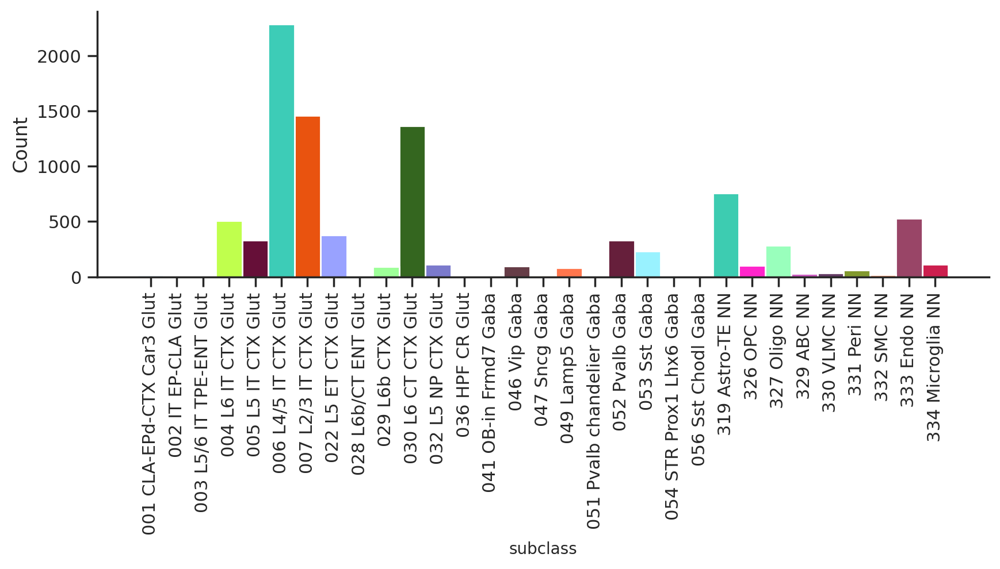

In [32]:
# Plot the distribution of subclasses
f, ax = plt.subplots(1, 1, figsize=(10, 3))
sns.histplot(data=one_sec.obs, x='subclass', hue='subclass', palette=ref, ax=ax, alpha=1)
ax.get_legend().remove()
# set font size for labels
ax.set_xlabel('subclass', fontsize=10)
plt.xticks(rotation=90)
plt.show()

In [64]:
# Multilayer graph construction hyperparameters and graph properties
graph_hparams = dict(
    d=40 / 1000,  # (in mm)
    L_thr=0.0,
    R_thr=0.0,
    lr_gene_pairs=[["Tac2", "Tacr3"], ["Penk", "Oprd1"], ["Pdyn", "Oprd1"], ["Pdyn", "Oprk1"], ["Grp", "Grpr"]],
)
graph_hparams["n_layers"] = len(graph_hparams["lr_gene_pairs"])
graph_hparams["num_nodes"] = df.shape[0]

edge_index_list = [None] * graph_hparams["n_layers"]
A_csr = [None] * graph_hparams["n_layers"]

In [65]:
# Restrict anndata file and df to y less than 2.75 and x between than 3.5 and 4.0
df = df[(df['y_reconstructed'] < 2.75) & (df['x_reconstructed'] > 3.5)]
df = df[df['x_reconstructed'] < 4.0]

one_sec = one_sec[(one_sec.obs['y_reconstructed'] < 2.75) & (one_sec.obs['x_reconstructed'] > 3.5)]
one_sec = one_sec[one_sec.obs['x_reconstructed'] < 4.0]

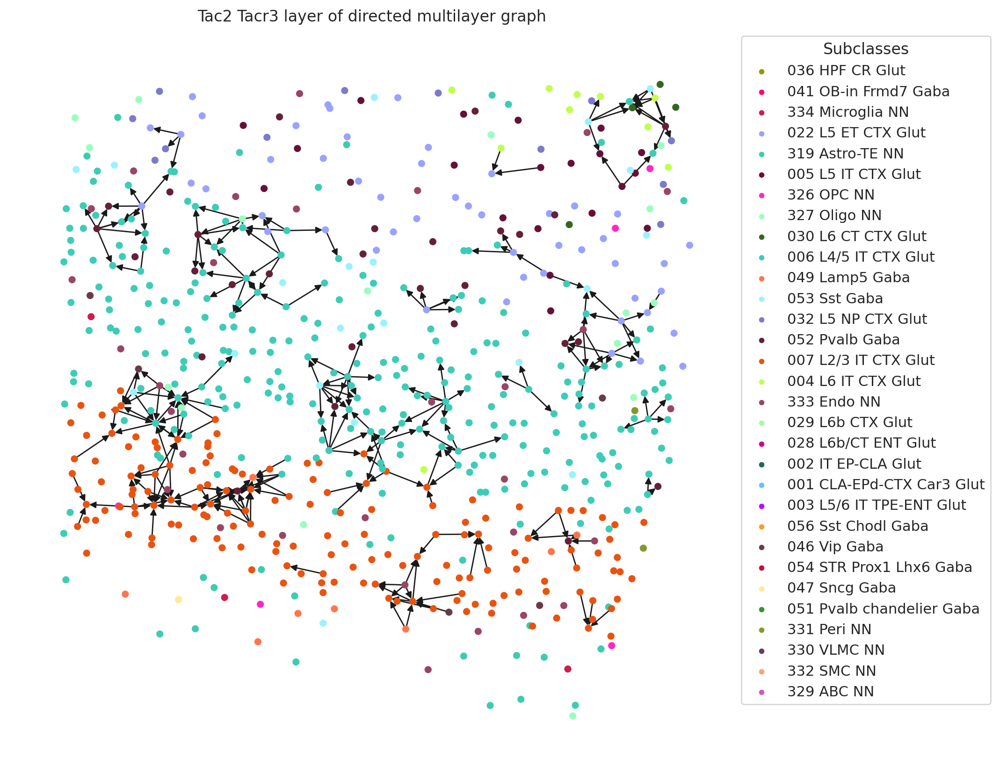

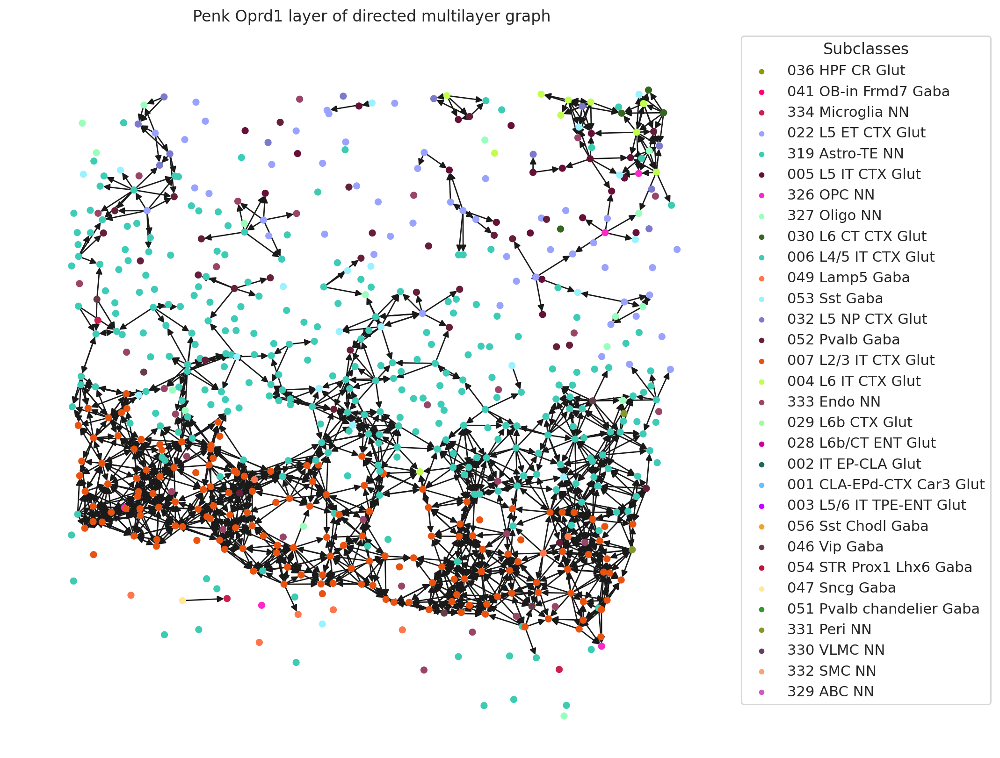

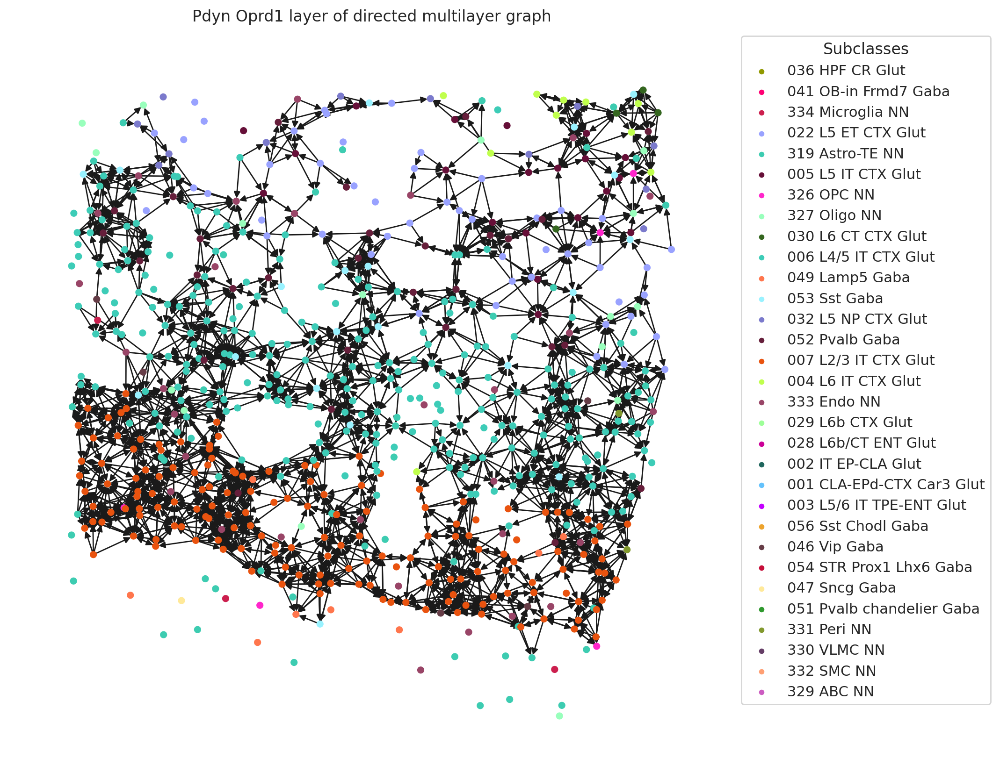

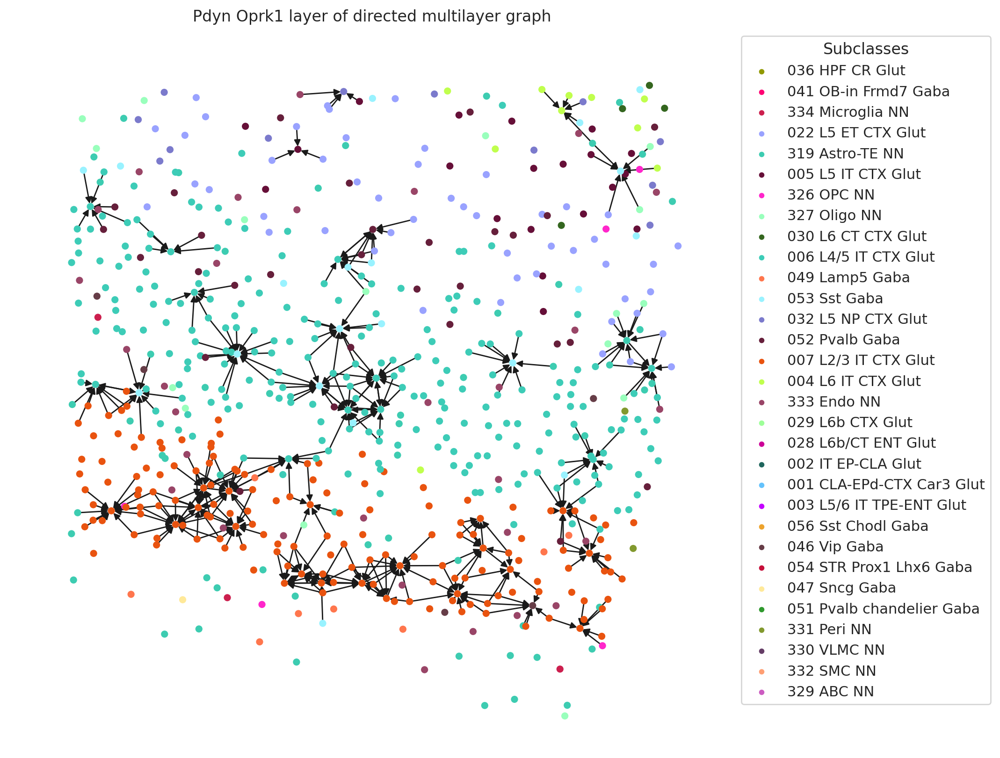

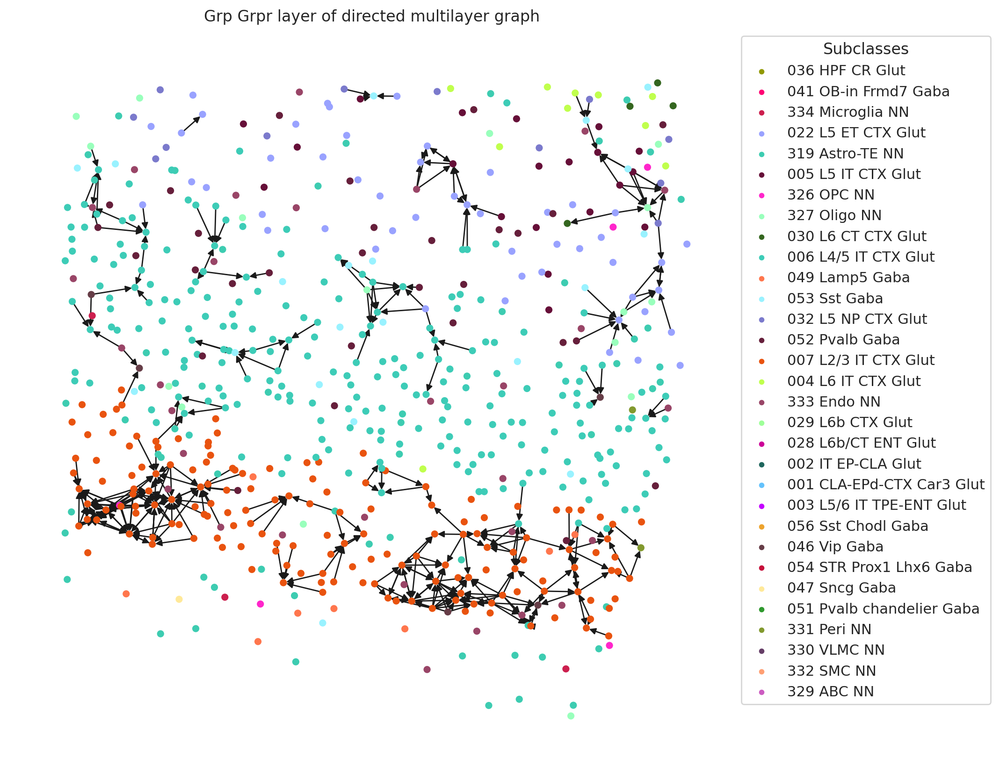

In [70]:
# Plot each layer of the multilayer graph with subclass as node colors

# Loop over ligand-receptor pairs that make up each layer of the multi-layer graph
for i in range(graph_hparams["n_layers"]):

    # New columns to indiciate if genes from ligand-receptor pair are being expressed
    ligand, receptor = graph_hparams["lr_gene_pairs"][i]
    df["L"] = one_sec[:, one_sec.var["gene_symbol"] == ligand].X.toarray().ravel()
    df["R"] = one_sec[:, one_sec.var["gene_symbol"] == receptor].X.toarray().ravel()
    df["L"] = (df["L"] > graph_hparams["L_thr"]).astype(bool)
    df["R"] = (df["R"] > graph_hparams["R_thr"]).astype(bool)
    
    # A[i, j] = 1 if vertex i expresses the peptide precursor gene and  vertex j expresses the GPCR gene
    A = df["L"].values.reshape(-1, 1) @ df["R"].values.reshape(1, -1)
    
    # Get distance matrix
    Dx = (df["x_reconstructed"].values.reshape(-1, 1) - df["x_reconstructed"].values.reshape(1, -1)) ** 2
    Dy = (df["y_reconstructed"].values.reshape(-1, 1) - df["y_reconstructed"].values.reshape(1, -1)) ** 2
    D = np.sqrt(Dx + Dy)
    del Dx, Dy

    # cells are connected only if within distance d
    A[D > graph_hparams["d"]] = 0

    # remove self loops from plot
    np.fill_diagonal(A, 0)
    A_csr[i] = csr_array(A)

    # Create networkx graph
    G = nx.from_scipy_sparse_array(A_csr[i], create_using=nx.DiGraph)

    pos = df_sub[['x_reconstructed', 'y_reconstructed']].values

    f, ax = plt.subplots(1, 1, figsize=(10, 10))
    nx.draw(G, pos, ax=ax, arrows=True, node_color=df_sub['subclass'].map(ref), with_labels=False, node_size=20)
    for key in ref:
        ax.scatter([], [],  s=10, color=ref[key], label=key)
    plt.legend(title='Subclasses', loc='upper left', bbox_to_anchor=(1, 1))
    plt.title(f'{ligand} {receptor} layer of directed multilayer graph')
    plt.show()




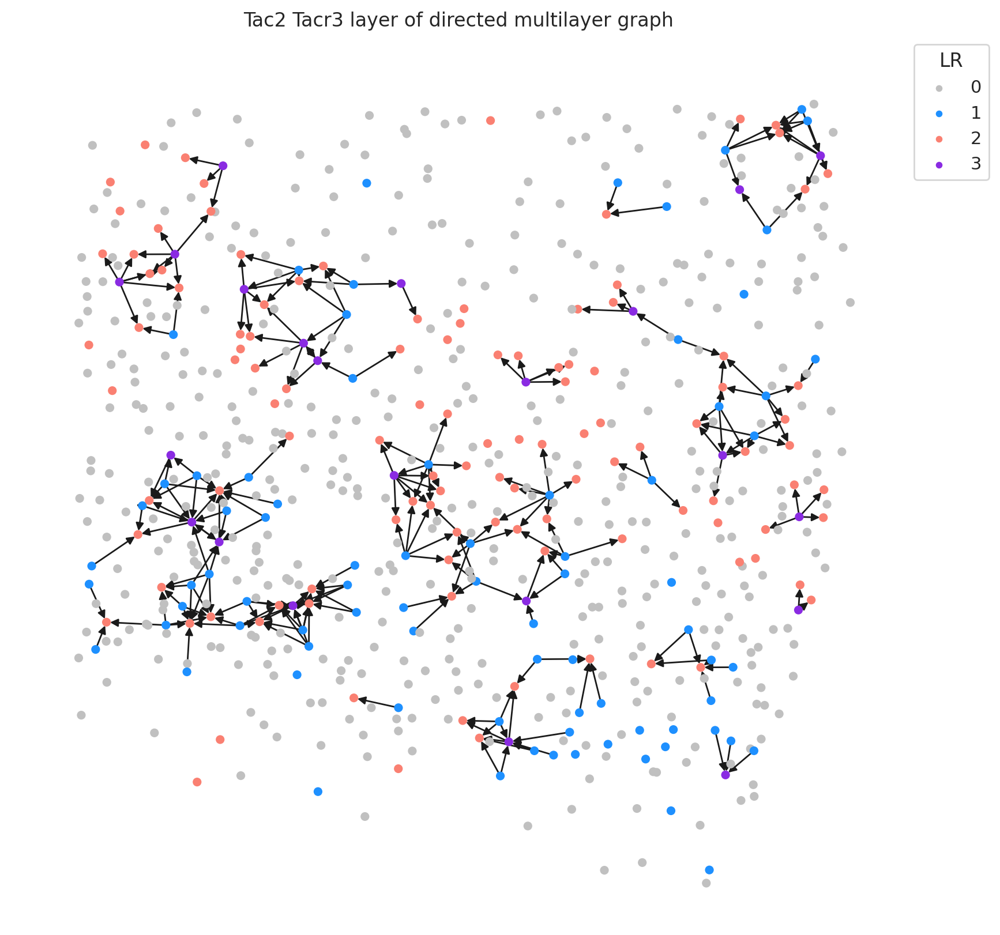

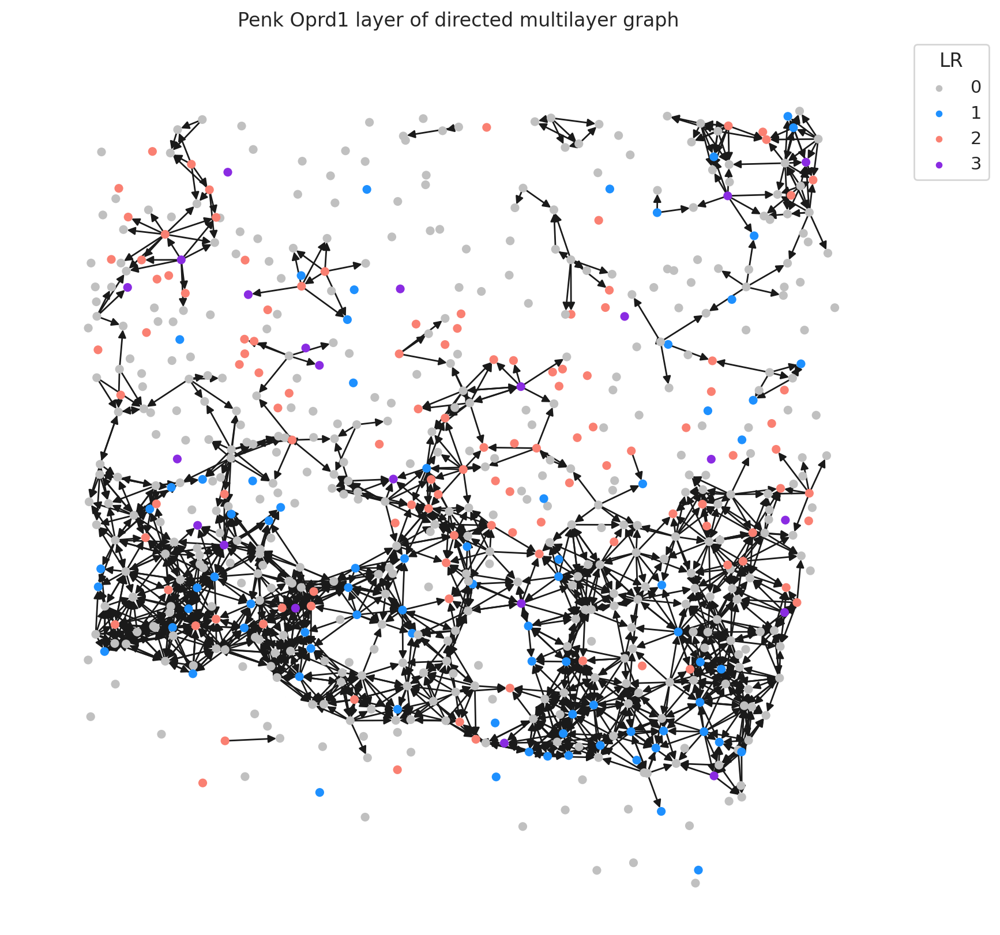

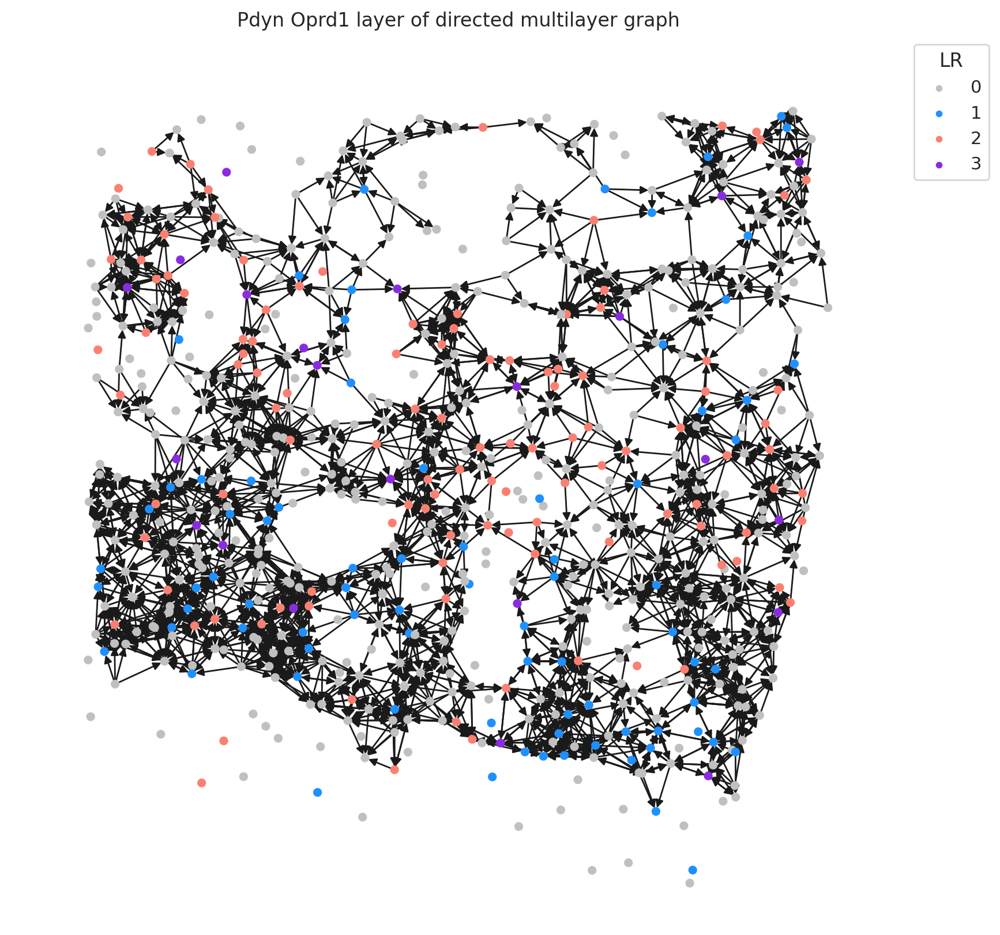

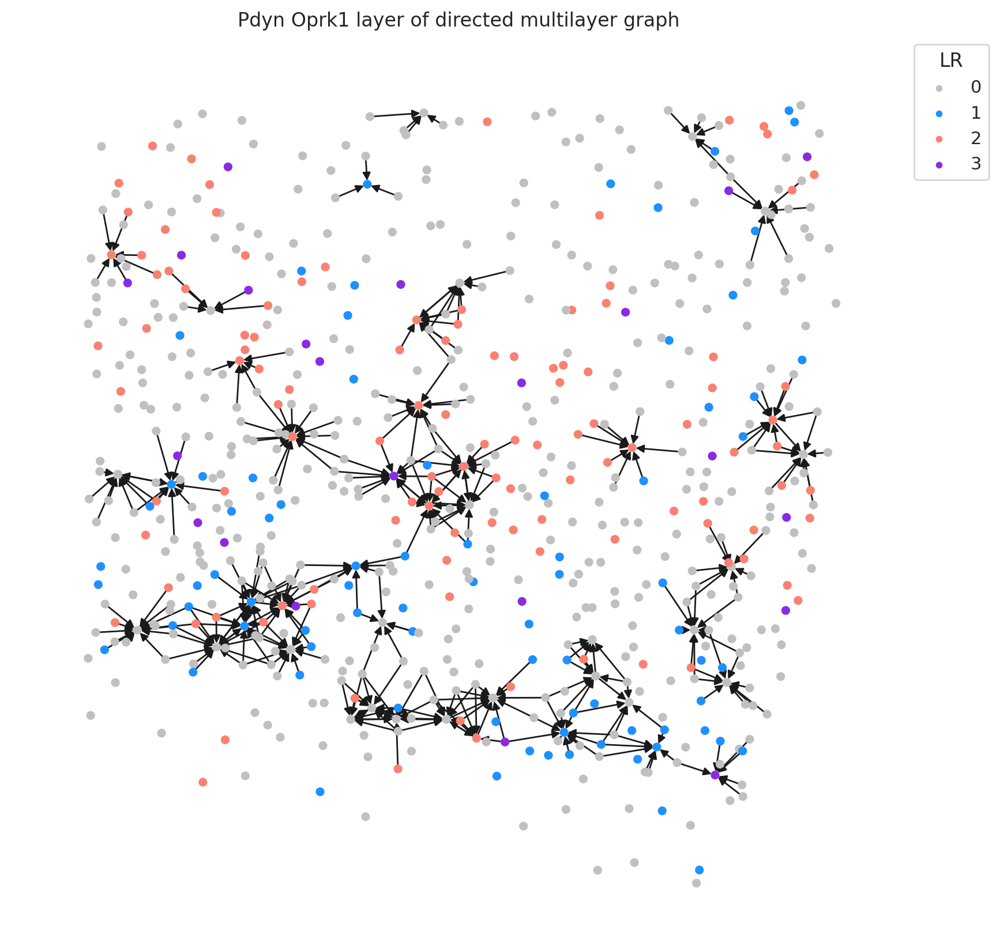

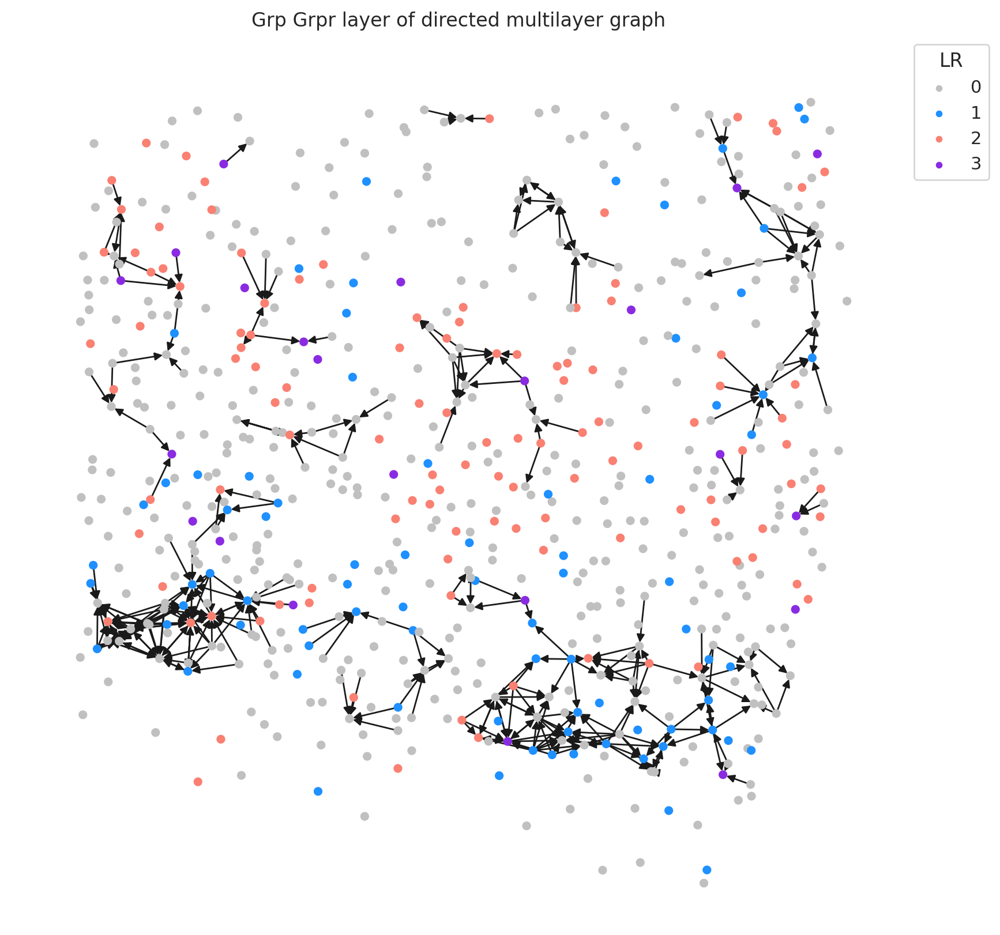

In [71]:
# Plot each layer of the multilayer graph with gene expression category as node colors

# Loop over ligand-receptor pairs that make up each layer of the multi-layer graph
for i in range(graph_hparams["n_layers"]):

    # New columns to indiciate if genes from ligand-receptor pair are being expressed
    ligand, receptor = graph_hparams["lr_gene_pairs"][i]
    df["L"] = one_sec[:, one_sec.var["gene_symbol"] == ligand].X.toarray().ravel()
    df["R"] = one_sec[:, one_sec.var["gene_symbol"] == receptor].X.toarray().ravel()
    df["L"] = (df["L"] > graph_hparams["L_thr"]).astype(bool)
    df["R"] = (df["R"] > graph_hparams["R_thr"]).astype(bool)

    # New column indicating gene expression category. if L==1, then 1, if R==1, then 2, if both 1, then 3
    df['LR'] = 0
    df.loc[(df['L']==1) & (df['R']==0), 'LR'] = 1
    df.loc[(df['L']==0) & (df['R']==1), 'LR'] = 2
    df.loc[(df['L']==1) & (df['R']==1), 'LR'] = 3
    
    # Color palette based on above column
    palette = {0:'silver', 1:'dodgerblue', 2:'salmon', 3:'blueviolet'}
    palette_str =  {0:'Neither', 1:'Only ligand', 2:'Only receptor', 3:'Both'}

    # A[i, j] = 1 if vertex i expresses the peptide precursor gene and  vertex j expresses the GPCR gene
    A = df["L"].values.reshape(-1, 1) @ df["R"].values.reshape(1, -1)
    
    # Get distance matrix
    Dx = (df["x_reconstructed"].values.reshape(-1, 1) - df["x_reconstructed"].values.reshape(1, -1)) ** 2
    Dy = (df["y_reconstructed"].values.reshape(-1, 1) - df["y_reconstructed"].values.reshape(1, -1)) ** 2
    D = np.sqrt(Dx + Dy)
    del Dx, Dy

    # cells are connected only if within distance d
    A[D > graph_hparams["d"]] = 0

    # remove self loops from plot
    np.fill_diagonal(A, 0)
    A_csr[i] = csr_array(A)

    # Create networkx graph
    G = nx.from_scipy_sparse_array(A_csr[i], create_using=nx.DiGraph)

    pos = df_sub[['x_reconstructed', 'y_reconstructed']].values

    f, ax = plt.subplots(1, 1, figsize=(10, 10))

    nx.draw(G, pos, ax=ax, arrows=True, node_color=df_sub['LR'].map(palette), with_labels=False, node_size=20)
    # show legend
    for key in palette:
        ax.scatter([], [],  s=10, color=palette[key], label=key)
    plt.legend(title='LR', loc='upper left', bbox_to_anchor=(1, 1))
    plt.title(f'{ligand} {receptor} layer of directed multilayer graph')
    plt.show()

